- **Author**: tootouch
- **Keras Doc**: [Deep Dream](https://keras.io/examples/generative/deep_dream/)
- **Google Brain Blog**: "[Inceptionism: Going Deeper into Neural Networks](https://ai.googleblog.com/2015/06/inceptionism-going-deeper-into-neural.html)"

**Open Source**
- **Deep Dream with Caffe(official)**: https://github.com/google/deepdream/blob/master/dream.ipynb
- **Deep Dream with Pytorch**: https://github.com/L1aoXingyu/Deep-Dream

![](https://raw.githubusercontent.com/Hvass-Labs/TensorFlow-Tutorials/master/images/14_deepdream_recursive_flowchart.png)

In [1]:
import numpy as np

import torch
from torchvision import transforms
from torch.autograd import Variable

import PIL
import matplotlib.pyplot as plt
from IPython.display import clear_output, display, Image
from io import BytesIO

import timm 

import scipy.ndimage as nd
from torch.autograd import Variable

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# device = 'cpu'

In [3]:
def showarray(a, fmt='jpeg'):
    a = np.uint8(np.clip(a, 0, 255))
    f = BytesIO()
    PIL.Image.fromarray(a).save(f, fmt)
    display(Image(data=f.getvalue()))
    
def showtensor(a, mean, std):
    mean = np.array(mean).reshape([1, 1, 3])
    std = np.array(std).reshape([1, 1, 3])
    inp = a[0, :, :, :]
    inp = inp.transpose(1, 2, 0)
    inp = std * inp + mean
    inp *= 255
    showarray(inp)
    clear_output(wait=True)


def deprocessed_image(arr, mean, std):
    mean = np.array(mean).reshape(1,1,3)
    std = np.array(std).reshape(1,1,3)
    
    arr = std * arr + mean
    arr = np.clip(arr*255, 0, 255).astype(np.uint8)
    
    return arr

def objective_guide(dst, guide_features):
    if guide_features is None:
        return dst.data
    else:
        x = dst.data[0].cpu().numpy()
        y = guide_features.data[0].cpu().numpy()
        
        A = x.T.dot(y)
        
        diff = y[:, A.argmax(1)]
        diff = torch.Tensor(np.array([diff])).cuda()
        
        return diff

def make_step(img, model, activation_dict, 
              control=None, distance=objective_guide, device='cpu', verbose=False, **kwargs):
    mean = np.array(model.default_cfg['mean']).reshape([3, 1, 1])
    std = np.array(model.default_cfg['std']).reshape([3, 1, 1])

    learning_rate = kwargs.get('learning_rate',2e-2)
    max_jitter = kwargs.get('max_jitter',32)
    num_iterations = kwargs.get('num_iteration',20)
    eval_every = kwargs.get('eval_every',10)

    guide_features = control

    for i in range(num_iterations):
        # apply jitter shift
        shift_x, shift_y = np.random.randint(-max_jitter, max_jitter + 1, 2)
        img = np.roll(np.roll(img, shift_x, -1), shift_y, -2)
        
        model.zero_grad()
        img_variable = Variable(torch.Tensor(img).to(device), requires_grad=True)
        
        _ = model(img_variable)
        act_value = activation_dict['target']
        
        # objective function
        diff_out = distance(act_value, guide_features)
        act_value.backward(diff_out)
        
        # loss
        if i % eval_every == 0 and verbose:
            print('loss: ',diff_out.mean().item())
        
        # gradient ascent
        ratio = img_variable.grad.square().mean().sqrt()
        learning_rate_use = learning_rate / ratio
        img_variable.data.add_(img_variable.grad.data * learning_rate_use)
        
        # clipping
        img = img_variable.data.cpu().numpy()  # b, c, h, w
        img = np.roll(np.roll(img, -shift_x, -1), -shift_y, -2)
        img[0, :, :, :] = np.clip(img[0, :, :, :], -mean / std, (1 - mean) / std)
        showtensor(img,
                   mean=model.default_cfg['mean'],
                   std=model.default_cfg['std'])
        
    return img


def dream(model,
          base_img,
          target_layer,
          octave_n=6,
          octave_scale=1.4,
          control=None,
          distance=objective_guide,
          device='cpu',
          verbose=False,
          **kwargs):
    
    # activation
    activation_dict = {}
    def get_activation(name):
        def hook(model, input, output):            
            activation_dict[name] = output
        return hook 
    
    for name, layer in model.named_modules():
        if name == target_layer:    
            layer.register_forward_hook(get_activation('target'))
    
    octaves = [base_img]
    for i in range(octave_n - 1):
        octaves.append(
            nd.zoom(
                octaves[-1], (1, 1, 1.0 / octave_scale, 1.0 / octave_scale),
                order=1))

    # control
    if control is not None:
        _ = model(control.to(device))
        control = activation_dict['target']
        
    detail = np.zeros_like(octaves[-1])
    for octave, octave_base in enumerate(octaves[::-1]):
        h, w = octave_base.shape[-2:]
        if octave > 0:
            h1, w1 = detail.shape[-2:]
            detail = nd.zoom(
                detail, (1, 1, 1.0 * h / h1, 1.0 * w / w1), order=1)

        input_oct = octave_base + detail

        out = make_step(input_oct, model, activation_dict, control, 
                        distance=distance, device=device, verbose=verbose, **kwargs)
        detail = out - octave_base
        
    arr = deprocessed_image(out[0].transpose([1,2,0]), 
                            mean=model.default_cfg['mean'], 
                            std=model.default_cfg['std'])
        
    return PIL.Image.fromarray(arr)

# Build Model

In [4]:
model = timm.create_model('vit_base_patch16_224',pretrained=True)
model.to(device)
model.eval()
print('the number of parameters: ',np.sum([p.numel() for p in model.parameters()]))

the number of parameters:  86567656


# Load Image

In [5]:
def transform_image(img, model, resize=False):
    if resize:
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize((224,224)),
            transforms.Normalize(
                model.default_cfg['mean'], model.default_cfg['std']
            )
        ])
    else:
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(
                model.default_cfg['mean'], model.default_cfg['std'])
        ])
        
    return transform(img)

In [6]:
sky_img = PIL.Image.open('./sky.png')
sky_tensor = transform_image(sky_img, model, resize=True).unsqueeze(0)
sky_np = sky_tensor.numpy()

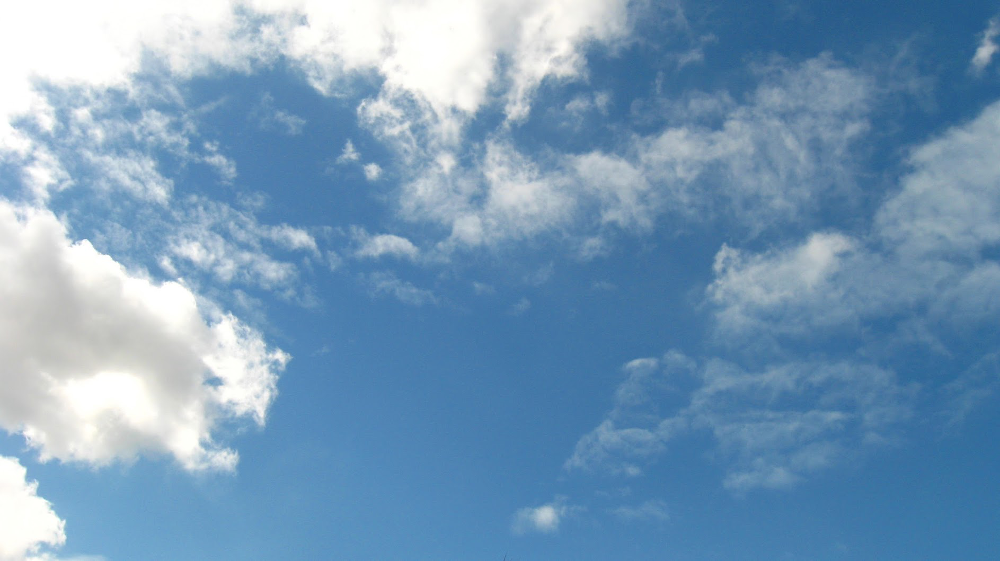

In [7]:
sky_img

# Check octave images resolution 

In [8]:
base_img = sky_np
octave_n = 6
octave_scale=1.4

octaves = [base_img]
for i in range(octave_n - 1):
    octaves.append(
        nd.zoom(
            octaves[-1], (1, 1, 1.0 / octave_scale, 1.0 / octave_scale),
            order=1))

for i in range(octave_n):
    print(octaves[i].shape)

(1, 3, 224, 224)
(1, 3, 160, 160)
(1, 3, 114, 114)
(1, 3, 81, 81)
(1, 3, 58, 58)
(1, 3, 41, 41)


# Deep Dream

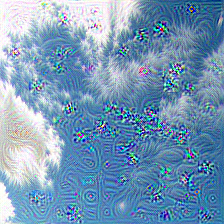

In [9]:
dream(model, sky_np, target_layer='blocks.3', device=device, octave_n=1, learning_rate=0.05, num_iteration=20)

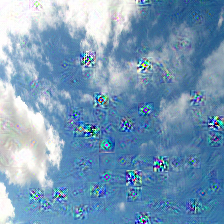

In [10]:
dream(model, sky_np, target_layer='blocks.6', device=device, octave_n=1, learning_rate=0.05, num_iteration=10)

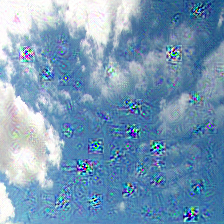

In [11]:
dream(model, sky_np, target_layer='blocks.8', device=device, octave_n=1, learning_rate=0.05, num_iteration=10)

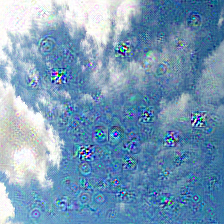

In [12]:
dream(model, sky_np, target_layer='blocks.11', device=device, octave_n=1, learning_rate=0.05, num_iteration=10)

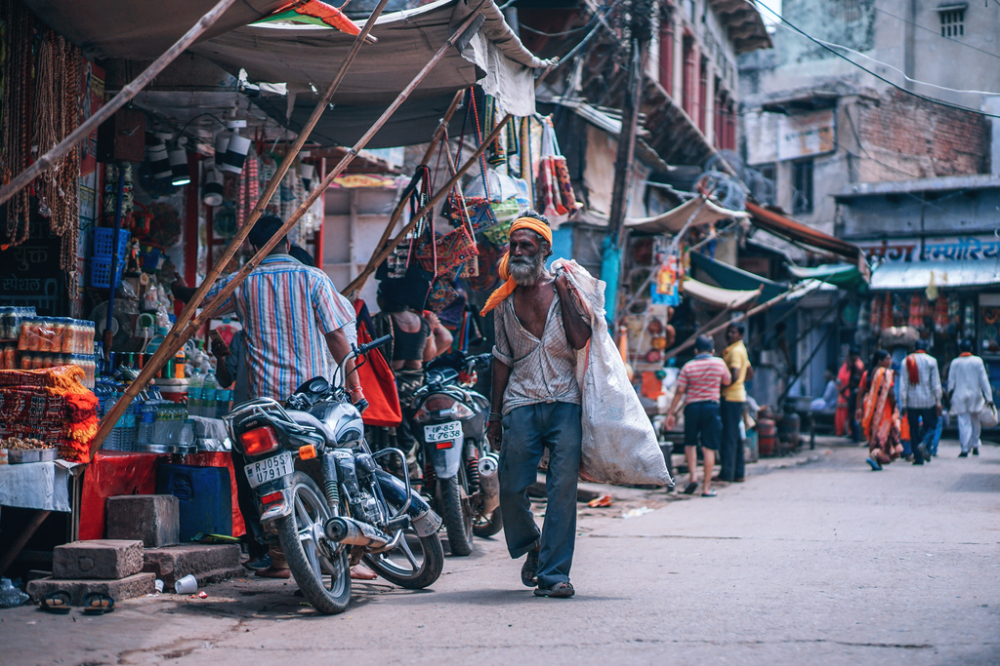

In [13]:
market_img = PIL.Image.open('./market1.jpg')
market_img.thumbnail([1024,1024], PIL.Image.ANTIALIAS)

market_tensor = transform_image(market_img, model, resize=True).unsqueeze(0)
market_np = market_tensor.numpy()
market_img

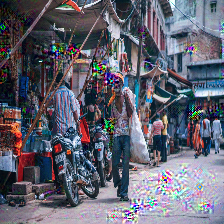

In [14]:
dream(model, market_np, target_layer='blocks.7', device=device, octave_n=1, learning_rate=0.05, num_iteration=10)

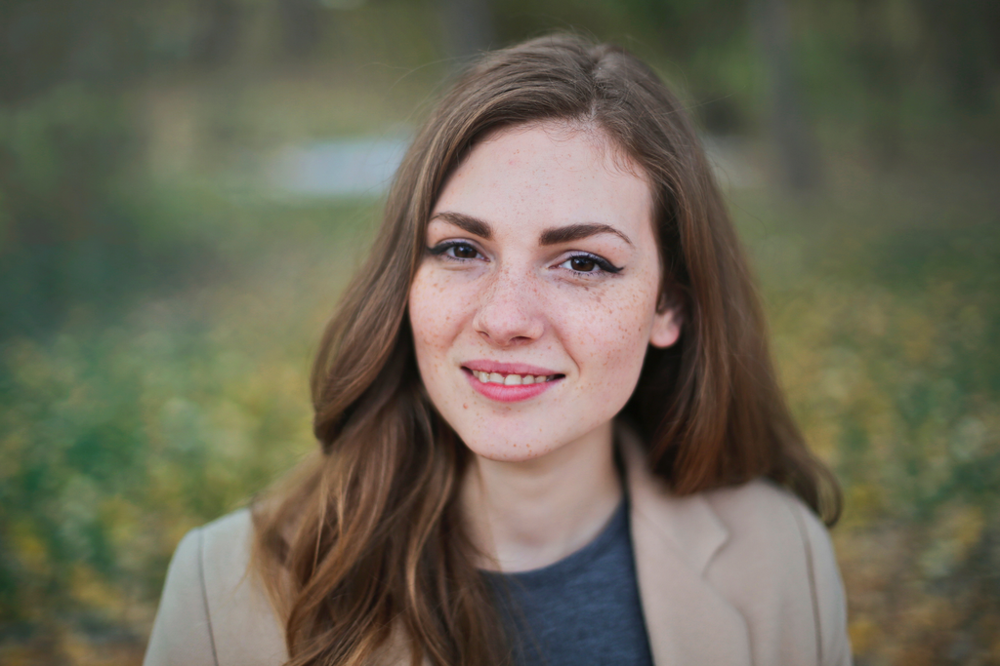

In [15]:
face_img = PIL.Image.open('./face1.jpg')
face_img.thumbnail([1024,1024], PIL.Image.ANTIALIAS)

face_tensor = transform_image(face_img, model, resize=True).unsqueeze(0)
face_np = face_tensor.numpy()
face_img

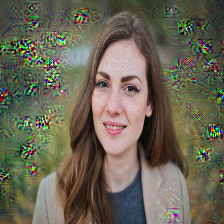

In [16]:
dream(model, face_np, target_layer='blocks.7', device=device, octave_n=1, learning_rate=0.05, num_iteration=10)

# Controlling the dream

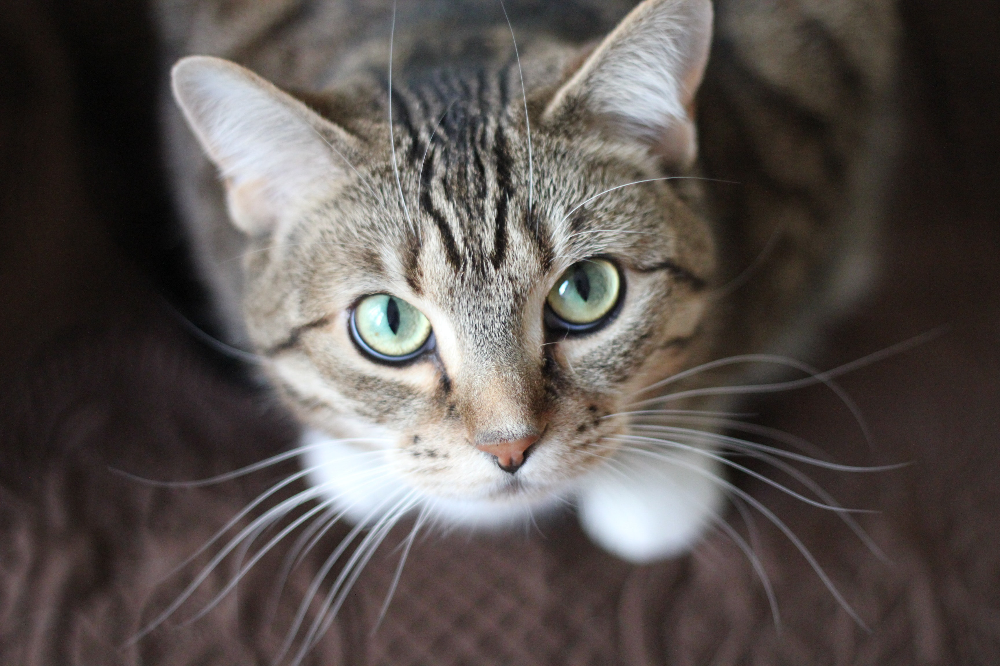

In [17]:
guide_img = PIL.Image.open('kitten2.jpg')
guide_tensor = transform_image(guide_img, model, resize=True).unsqueeze(0)
guide_img

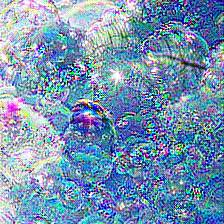

In [18]:
dream(model, sky_np, target_layer='blocks.11', 
      control=guide_tensor, device=device, octave_n=1, learning_rate=0.05, num_iteration=100)

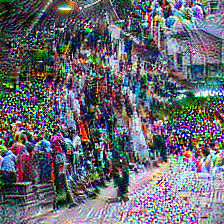

In [19]:
dream(model, market_np, target_layer='blocks.7', 
      control=guide_tensor, device=device, octave_n=1, learning_rate=0.05, num_iteration=100)

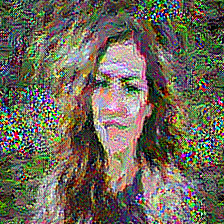

In [20]:
dream(model, face_np, target_layer='blocks.7', 
      control=guide_tensor, device=device, octave_n=1, learning_rate=0.05, num_iteration=100)

# Tootouch into dream

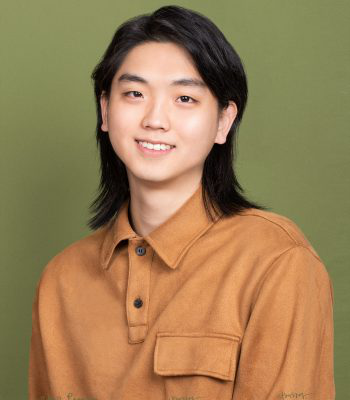

In [21]:
tootouch_img = PIL.Image.open('../Variational_AutoEncoder/dsba/tootouch.jpeg')

tootouch_tensor = transform_image(tootouch_img, model, resize=True).unsqueeze(0)
tootouch_np = tootouch_tensor.numpy()
tootouch_img

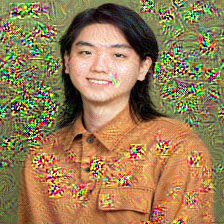

In [22]:
dream(model, tootouch_np, target_layer='blocks.7', device=device, octave_n=1, learning_rate=0.05, num_iteration=40)

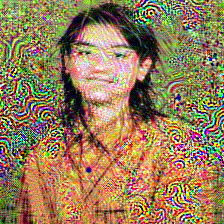

In [23]:
dream(model, tootouch_np, target_layer='blocks.7', 
      control=guide_tensor, device=device, octave_n=1, learning_rate=0.05, num_iteration=100)

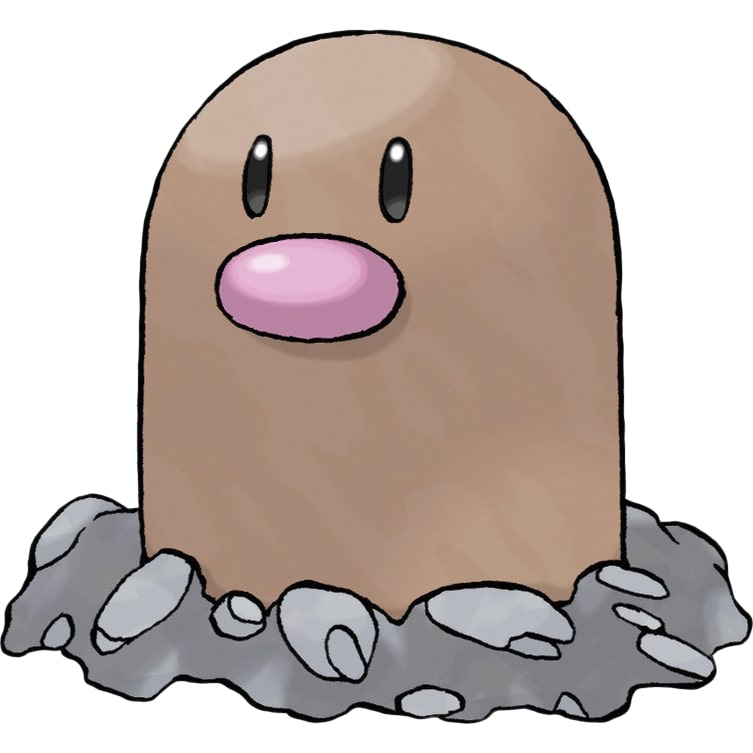

In [24]:
digda_img = PIL.Image.open('digda.jpg')
digda_tensor = transform_image(digda_img, model, resize=True).unsqueeze(0)
digda_np = digda_tensor.numpy()
digda_img

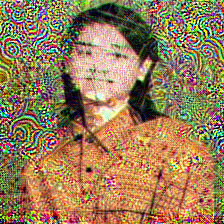

In [25]:
dream(model, tootouch_np, target_layer='blocks.7', 
      control=digda_tensor, device=device, octave_n=1, learning_rate=0.05, num_iteration=100)

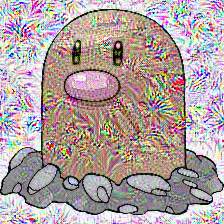

In [26]:
dream(model, digda_np, target_layer='blocks.7', 
      control=tootouch_tensor, device=device, octave_n=1, learning_rate=0.05, num_iteration=100)

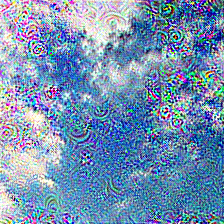

In [27]:
dream(model, sky_np, target_layer='blocks.7', 
      control=tootouch_tensor, device=device, octave_n=1, learning_rate=0.05, num_iteration=100)

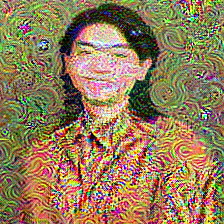

In [28]:
dream(model, tootouch_np, target_layer='blocks.7', 
      control=sky_tensor, device=device, octave_n=1, learning_rate=0.05, num_iteration=100)